# Описание проекта <a id='intro'></a> 

Необходимо подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

# Описание данных  

Предоставлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках.  

Файл moscow_places.csv:  
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
  - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
  -	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  -	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  -	Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
  -	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  -	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  -	Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  -	0 — заведение не является сетевым
  -	1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

# План действий

[1. Загрузка данных и изучение общей информации](#loading_data) <br>
[2. Предобработка данных](#data_preprocessing) <br>
[3. Исследовательский анализ данных](#EDA) <br>
[4. Выводы по анализу данных](#EDA_res) <br>
[5. Исследование кофеен](#coffee_house) <br>
[6. Выводы и рекомендации по исследованию кофеен](#conclusions)

## Установка модулей

In [1]:
!pip3 install sidetable
!pip3 install missingno

## Импорт бибилиотек

In [2]:
import pandas as pd

import numpy as np

import datetime as dt

import seaborn as sns

import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
register_matplotlib_converters()

import plotly.express as px
from plotly import graph_objects as go

import folium

import re

import math as mth

import os

import sidetable as stb

import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

import json

import missingno as msno

<a id='loading_data'></a>
## Загрузка данных

Загрузим данные.

In [3]:
pth_1 = '/datasets/moscow_places.csv'
pth_2 = 'https://code.s3.yandex.net/datasets/moscow_places.csv'

if os.path.exists(pth_1):
    places = pd.read_csv(pth_1)
elif os.path.exists(pth_2):
    places = pd.read_csv(pth_2)
else:
    print('Проверьте правильность пути к датафрейму')

Ознакомимся с датасетом.

In [4]:
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


[в начало](#intro)

<a id='data_preprocessing'></a>
## Предобработка данных

### Общая информация

In [5]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете 14 столбцов и 8406 строк.  
Тип данных у 6 столбцов  float64, у 7 столбцов object и 1 столбец int64.  
В столбцах имеются пропуски значений.  

### Проверка наличия пропусков

In [6]:
round(places.stb.missing(),2)

,missing,total,percent
middle_coffee_cup,7871,8406,93.64
middle_avg_bill,5257,8406,62.54
price,5091,8406,60.56
avg_bill,4590,8406,54.60
seats,3611,8406,42.96
hours,536,8406,6.38
name,0,8406,0.00
category,0,8406,0.00
address,0,8406,0.00
district,0,8406,0.00


В 6 столбцах присутствуют пропуски.  

В столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup, seats существенное количество пропущенных значений, доля прропусков составляет от 43% до 94%.  

Оставим строки с пропущенными значениями, поскольку удаление приведет к существенной потере данных.  

В случае выявления перспективной локации, возможно потребуется провести более детальный анализ пропущенных значений окружения данной локации (получить из открытых/закрытых источников интересующей информации).

Построим матрицу пропущенных значений, чтобы определить наличие какой-либо закономерности.

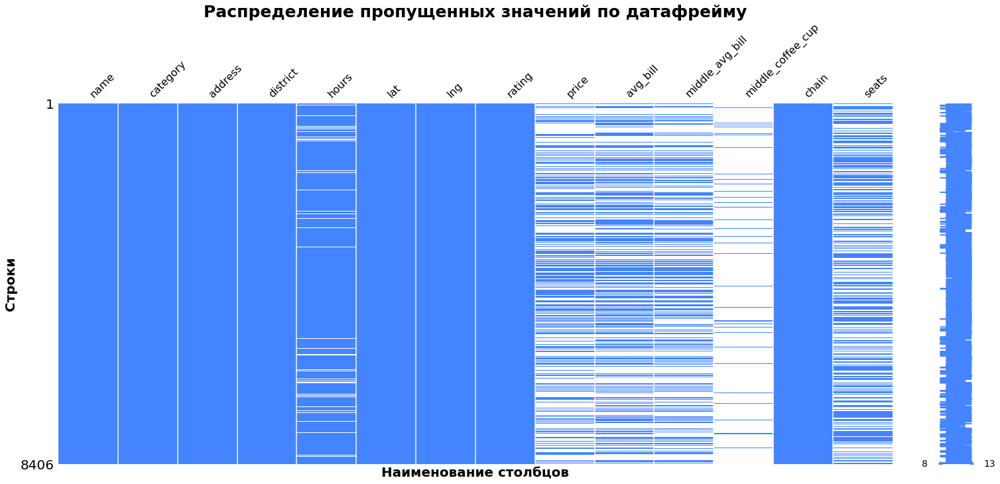

In [7]:
msno.matrix(places, color=(0.27, 0.52, 1.0))

plt.title('Распределение пропущенных значений по датафрейму', fontsize=25, fontweight="bold")
plt.xlabel('Наименование столбцов', fontsize=20, fontweight="bold")
plt.ylabel('Строки', fontsize=20, fontweight="bold");
plt.show();

Распределение пропущенных значений в датафрейме выглядит случайным.

### Проверка наличия дубликатов

**Перед поиском дубликатов, сделаем накоторые преобразования, которые помогут в поиске.**

Переведем все значения названий заведений и адреса к нижнему регистру.

In [8]:
places['name'] = places['name'].str.lower()
places['address'] = places['address'].str.lower()

Заменим в наименованиях и адресах ё на е.

In [9]:
places['name'] = places['name'].str.replace('ё', 'е', regex=True)
places['address'] = places['address'].str.replace('ё', 'е', regex=True)

Заменим знак точка на пробел в наименованиях.

In [10]:
places['name'] = places['name'].str.replace('.', ' ', regex=True)

Заменим двойной пробел на одинарный.

In [11]:
places['name'] = places['name'].str.replace('  ', ' ', regex=True)
places['address'] = places['address'].str.replace('  ', ' ', regex=True)

**Проверим на наличие дубликатов.**

In [12]:
places.duplicated().sum()

0

Явные дубликаты не обнаружены.

Проверим на наличие неявных дубликатов.

In [13]:
print('Количество дубликатов по широте, долготе и названию', \
      places.duplicated(['lat', 'lng', 'name']).sum())
print('Количество дубликатов по названию и адресу', \
      places.duplicated(['name', 'address']).sum())
print('Количество дубликатов по широте, долготе и адресу', \
      places.duplicated(['lat', 'lng', 'address']).sum())

Количество дубликатов по широте, долготе и названию 1
Количество дубликатов по названию и адресу 4
Количество дубликатов по широте, долготе и адресу 31


**Обработаем дубликаты.**

Посмотрим на дубликаты по имени, широте и долготе.

In [14]:
places.loc[places.duplicated(subset=['lat', 'lng', 'name'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Проверим, является ли заведение сетевым.

In [15]:
places.query('name == "more poke"')['name'].count()

3

Заведение является сетевым, поэтому удалим 1-ю строчку.

In [16]:
places = places.drop_duplicates(subset=['lat', 'lng', 'name'], keep = 'last').reset_index(drop=True)
places.shape

(8405, 14)

Оставили последнее вхождение, кол-во строк изменилось до 8405.

Посмотрим на дубликаты по названию и адресу.

In [17]:
places.loc[places.duplicated(subset=['address', 'name'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
2210,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2419,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3090,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3108,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Проверим являются ли заведения сетевыми.

In [18]:
print(places.query('name == "раковарня клешни и хвосты"')['name'].count())
print(places.query('name == "хлеб да выпечка"')['name'].count())

3
3


Заведения раковарня клешни и хвосты и хлеб да выпечка являются сетевыми.

Заведения с наименованием кафе находятся в одной локации, имееют одинаковую оценку, но имеют разные широту и долготу (возможно некорректно внесение информации). Сделаем допущение, что это одно и тоже заведение.  

Раковарня клешни и хвосты и хлеб да выпечка являются сетевыми, поэтому оставим строки, где в столбце chain указано 1.

Удалим дубликаты.

In [19]:
places = places.drop(index= [215, 2210, 3108])
places.reset_index(drop=True)
places.shape

(8402, 14)

Дубликаты удалили, количество строк изменилось до 8402.

Посмотрим наименования заведений в строчках с одинаковой широтой, долготой и адресом.  
Необязательно, что данные заведения являются дубликатами, возможно, они просто расположены в одном пространстве, но также и , возможно, что внесена неверная информация, либо не обновили информацию (по адресу уже неработающего заведения расположено заведение с иным названием).

In [20]:
places.loc[places.duplicated(subset=['lat', 'lng', 'address'], keep = False)].sort_values(by='address')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1071,кафе,быстрое питание,"москва, анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,NaN,55.863555,37.682835,3.7,NaN,NaN,NaN,NaN,0,100.0
1074,халяль кафе-пекарня,булочная,"москва, анадырский проезд, 8, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.863555,37.682835,3.7,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,100.0
7766,за обе щеки,кафе,"москва, варшавское шоссе, вл132/2",Южный административный округ,"ежедневно, 09:00–21:00",55.620316,37.608922,3.6,NaN,NaN,NaN,NaN,1,NaN
7659,100лоффка,столовая,"москва, варшавское шоссе, вл132/2",Южный административный округ,пн-пт 09:00–17:30,55.620316,37.608922,4.4,низкие,Средний счёт:100–270 ₽,185.0,NaN,0,NaN
348,meat лав,ресторан,"москва, головинское шоссе, 10б",Северный административный округ,"ежедневно, 11:00–23:00",55.837181,37.497324,5.0,средние,Средний счёт:300–600 ₽,450.0,NaN,0,NaN
662,family cafe mayak,ресторан,"москва, головинское шоссе, 10б",Северный административный округ,"ежедневно, 10:00–22:00",55.837181,37.497324,4.7,NaN,NaN,NaN,NaN,0,NaN
121,встреча,кафе,"москва, карельский бульвар, 4а",Северный административный округ,"ежедневно, круглосуточно",55.891936,37.536068,4.1,NaN,NaN,NaN,NaN,1,NaN
182,карелия,кафе,"москва, карельский бульвар, 4а",Северный административный округ,"ежедневно, 09:00–00:00",55.891936,37.536068,3.7,NaN,NaN,NaN,NaN,0,NaN
3000,хинкальная,кафе,"москва, краснобогатырская улица, 79",Восточный административный округ,"ежедневно, 09:00–00:00",55.805361,37.708967,4.1,NaN,NaN,NaN,NaN,1,NaN
2938,прошу к столу,булочная,"москва, краснобогатырская улица, 79",Восточный административный округ,"ежедневно, 10:00–21:00",55.805361,37.708967,3.8,средние,Средний счёт:300 ₽,300.0,NaN,0,NaN


Обнаружены дубликаты для заведений с индексами:
- 1071 и 1074 (при обработке оставим с индексом 1074)
- 1324 и 1451 (необходимо проверить является ли сетевым), удалим с индексом 1451 если несетевое
- 5313 и 5315 (необходимо проверить является ли сетевым), удалим с индексом 5313 если несетевое

Проверим являются ли заведения сетевыми.

In [21]:
print(places.query('name == "сикварули"')['name'].count())
print(places.query('name == "leon"')['name'].count())

2
2


Заведения не являются сетевыми.

Удалим дубликаты.

In [22]:
places = places.drop(index= [1071, 1451, 5313])
places.reset_index(drop=True)
places.shape

(8399, 14)

Удалили дубликаты, строк стало 8399.

Проверим наличие неявных дубликатов в категориях заведений.

In [23]:
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Неявные дубликаты не выявлены.

### Проверка типа данных

In [24]:
places.dtypes

name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                  int64
seats                float64
dtype: object

Изменим тип данных у столбцов 'middle_avg_bill', 'middle_coffee_cup', 'seats' на целое число.

In [25]:
places[['middle_avg_bill', 'middle_coffee_cup', 'seats']] = (
    places[['middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .astype(float)
    .astype('Int64')
)

In [26]:
places[['middle_avg_bill', 'middle_coffee_cup', 'seats']].dtypes

middle_avg_bill      Int64
middle_coffee_cup    Int64
seats                Int64
dtype: object

Изменения внесены успешно.

### Проверка наличия нетипичных значений

Создадим списки со столбцами, в которых целочисленный и вещественный тип данных.

In [27]:
columns_num = (
    places.select_dtypes(include=['int64']).columns.tolist() 
    + places.select_dtypes(include=['float64']).columns.tolist()
)

**Проверим наличие отрицательных значений.**  

Из описания таблицы - отрицательные значения не могут находиться в столбцах с числовыми значениями.

In [28]:
for column in columns_num:
    print('Количество отрицательных значений в {}'.format(column),
          places[places[column] < 0][column].count())

Количество отрицательных значений в middle_avg_bill 0
Количество отрицательных значений в middle_coffee_cup 0
Количество отрицательных значений в chain 0
Количество отрицательных значений в seats 0
Количество отрицательных значений в lat 0
Количество отрицательных значений в lng 0
Количество отрицательных значений в rating 0


Отрицательные значения отсутствуют.

**Проверим наличие значения 0 в столбцах с числовыми значениями.**  

Значение 0 может находиться только в столбце chain по описанию таблицы.

In [29]:
for column in columns_num:
    print('Количество нулей в {}'.format(column),
          places[places[column] == 0][column].count())

Количество нулей в middle_avg_bill 1
Количество нулей в middle_coffee_cup 0
Количество нулей в chain 5196
Количество нулей в seats 136
Количество нулей в lat 0
Количество нулей в lng 0
Количество нулей в rating 0


В столбцах middle_avg_bill и seats обнаружены значения 0.  
В столбце seats значение 0 может быть только в том случае, если заведение работает только на вынос (как пример булочные и кофении).
Наличие значения 0 в столбце chain соответствует описанию данных таблицы.

Заменим 0 на пропуски в столбцах middle_avg_bill, в столбце seats заменим у всех заведений за исключением кофейня и булочная.

In [30]:
places['middle_avg_bill'] = places['middle_avg_bill'].replace(['0', 0], np.nan)

Посмотрим сколько значений 0 в столбце seats у кофеен и булочных.

In [31]:
print(places.query('(category == "кофейня" | category == "булочная") & seats == 0')['seats'].count())

35


Создадим список без кофеен и булочных.

In [32]:
list_nul = ['кофейня', 'булочная']
list_category = places['category'].unique().tolist()

for i in list_nul:
    list_category.remove(i)
print(list_category)

['кафе', 'ресторан', 'пиццерия', 'бар,паб', 'быстрое питание', 'столовая']


Заменим 0 в столбцах у заведений, кроме кофеен и булочных.

In [33]:
for i in list_category:
    places.loc[(places['category'] == i) & (places['seats'] == 0), 'seats'] = np.nan

In [34]:
for column in columns_num:
    print('Количество нулей в {}'.format(column),
          places[places[column] == 0][column].count())

Количество нулей в middle_avg_bill 0
Количество нулей в middle_coffee_cup 0
Количество нулей в chain 5196
Количество нулей в seats 35
Количество нулей в lat 0
Количество нулей в lng 0
Количество нулей в rating 0


Заменили в столбцах дф 0 на nan, за исключением столбца seats у кофеен и булочных.

**Проверим значения в столбце chain и заменим на более понятные выражения, те 0 - несетевой, 1 - сетевой.**  

По описанию таблицы в столбце должны находиться только значения 0 или 1.

In [35]:
places["chain"].unique()

array([0, 1])

В столбце находятся только значения 0 и 1.

In [36]:
places['chain'] = places['chain'].replace([0, 1], ['несетевое', 'сетевое'])

places['chain'].unique()

array(['несетевое', 'сетевое'], dtype=object)

Изменили значения.

### Создадим столбец street с названиями улиц из столбца с адресом

In [37]:
places['street'] = places['address'].str.extract('(\s\D+)[,$]+', expand=True)
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,<NA>,несетевое,<NA>,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,<NA>,несетевое,4,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,<NA>,несетевое,45,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170,несетевое,<NA>,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,<NA>,сетевое,148,правобережная улица


Проверим наличие пропущенных значений.

In [38]:
places['street'].isna().sum()

97

97 пропусков.

Посмотрим на значения в столбце address у данных пропусков.

In [39]:
places.query('street.isna() == True')['address'].unique()

array(['москва, парк левобережный',
       'москва, ландшафтный заказник лианозовский',
       'москва, лианозовский парк культуры и отдыха',
       'москва, парк алтуфьево', 'москва, парк ангарские пруды',
       'москва, проектируемый проезд № 5265',
       'москва, парк этнографическая деревня бибирево',
       'москва, парк культуры и отдыха северное тушино',
       'москва, парк дружбы', 'москва, ленинградское шоссе',
       'москва, коптевский бульвар д 18 а стр 1',
       'москва, грузинский сквер', 'москва, парк останкино',
       'москва, главный ботанический сад имени н.в. цицина российской академии наук',
       'москва, парк сад будущего',
       'москва, памятник природы серебряный бор',
       'москва, улица черняховского', 'москва, 3-й лучевой просек',
       'москва, третье транспортное кольцо', 'москва, рижский проезд',
       'москва, парк сокольники', 'москва, проезд сокольнического круга',
       'москва, песочная аллея', 'москва, улица гиляровского',
       'москва

В основном данные заведения расположены в парках.

Заменим пропуски на значение 'улица не определена'.

In [40]:
places['street'] = places['street'].fillna('улица не определена')
places['street'].isna().sum()

0

### Создадим столбец is_24/7 с обозначением работы заведения: 
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [41]:
places['hours'].value_counts().head()

ежедневно, 10:00–22:00      757
ежедневно, круглосуточно    730
ежедневно, 11:00–23:00      396
ежедневно, 10:00–23:00      310
ежедневно, 12:00–00:00      253
Name: hours, dtype: int64

Создадим функцию category_hours, которая принимает в качестве аргумента строку датасета (row) и при выполнении условия возвращает нужное нам значение (True или False) 

In [42]:
def category_hours(row):
    try:
        if row['hours'] == 'ежедневно, круглосуточно':
            return True
        else:
            return False
    
    except:
        print('ошибка')       

Создадим столбец 'is_24/7', для этого к датафрейму применим метод apply() с аргументом созданной функцией category_hours().

In [43]:
places['is_24/7'] = places.apply(category_hours, axis=1)

# проверим правильность работы функции
if len(places[places['is_24/7'] == True]) == len(places.query('hours in "ежедневно, круглосуточно"')):
    print('функция работает правильно')
else:
    print('ошибка')

функция работает правильно


**Сбросим индексы после обработки данных и посморим общую информацию о дф после внесенных изменений**

In [44]:
places = places.reset_index(drop=True)
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8399 entries, 0 to 8398
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8399 non-null   object 
 1   category           8399 non-null   object 
 2   address            8399 non-null   object 
 3   district           8399 non-null   object 
 4   hours              7865 non-null   object 
 5   lat                8399 non-null   float64
 6   lng                8399 non-null   float64
 7   rating             8399 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    Int64  
 12  chain              8399 non-null   object 
 13  seats              4689 non-null   Int64  
 14  street             8399 non-null   object 
 15  is_24/7            8399 non-null   bool   
dtypes: Int64(2), bool(1), fl

### Промежуточный вывод: 

В датасете 14 столбцов и 8406 строк.
Тип данных у 6 столбцов float64, у 7 столбцов object и 1 столбец int64.
В 6 столбцах есть пропущенные значения (в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup, seats доля пропусков составляет от 43% до 94%).

При обработке данных:
- пропуски не обработали, поскольку удаление приведет к существенной потере данных
- нашли и устранили дубликаты
- изменили тип данных у столбцов 'middle_avg_bill', 'middle_coffee_cup', 'seats' на целое число
- проверили и устранили нетипичные значения
- создали 2 столбца: столбец street с названиями улиц и столбец is_24/7 с обозначением работы заведения

После обработки данных стало 8399 строк и 16 столбцов.

[в начало](#intro)

<a id='EDA'></a>
## Анализ данных

### Категории заведений

In [45]:
print('Количество заведений', len(places))

Количество заведений 8399


#### Количество заведений в каждой категории

In [46]:
count_places = places['category'].value_counts().reset_index()
count_places.columns = ['category', 'count']
count_places['share, %'] = round(100 * count_places['count'] / len(places), 1)

count_places

,category,count,"share, %"
0,кафе,2376,28.3
1,ресторан,2039,24.3
2,кофейня,1413,16.8
3,"бар,паб",765,9.1
4,пиццерия,633,7.5
5,быстрое питание,602,7.2
6,столовая,315,3.8
7,булочная,256,3.0


#### График распределения заведений по категориям

In [47]:
fig = px.bar(count_places.sort_values(by='count'), 
             x='count', 
             y='category', 
             text='count' 
            )

fig.update_layout(title='Распределение заведений',
                   xaxis_title='Количество',
                   yaxis_title='Категория заведения')
fig.show() 

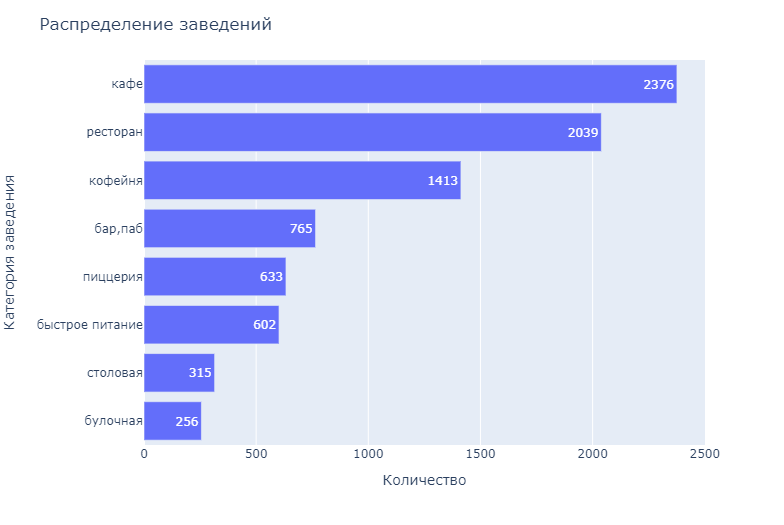

In [48]:
fig = go.Figure(data=[go.Pie(labels=count_places['category'], values=count_places['count'])]);

fig.update_layout(title='Доля заведений по категориям',
                 width=600,
                 height=400)
fig.show()

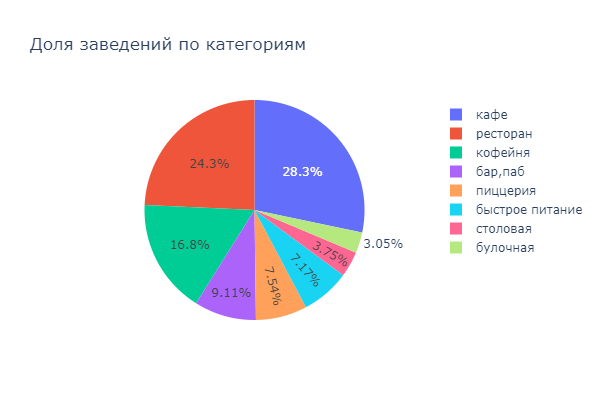

Топ-3 категории заведение на рынке Москвы:
- 28,3% рынка занимают кафе
- 24,3% рестораны
- 16,8 кофейни

#### Промежуточный вывод

После предобработки данных  в дф осталось 8399 заведений.  

Количество заведений разрезе по категориям:
- практически 70% всех заведений в дф представлено 3 видами (кафе - 2376, ресторан - 2039, кофейня - 1413)
- ориентировочно 24% приходится на категории бар (765), пиццерия (633), быстрое питание (602) 
- меньше всего заведений (почти 7%) приходится на булочные (256) и столовые (315).

### Анализ количества посадочных мест в заведениях

Посмотрим описательную статистику по столбцу со значениями посадочных мест.

In [49]:
round(places['seats'].describe())

count    4689.0
mean      111.0
std       123.0
min         0.0
25%        40.0
50%        76.0
75%       140.0
max      1288.0
Name: seats, dtype: float64

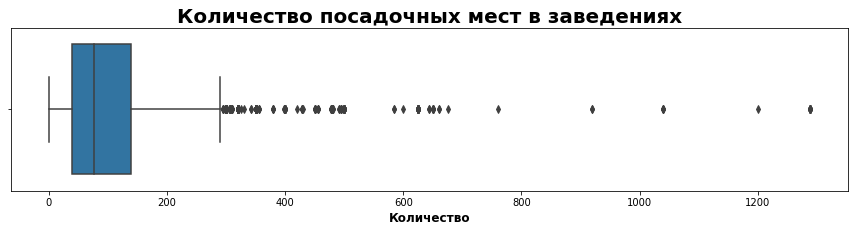

In [50]:
plt.figure(figsize=(15,3))
sns.boxplot(data = places, x='seats')

plt.title('Количество посадочных мест в заведениях', fontsize=20, fontweight="bold")
plt.xlabel('Количество', fontsize=12, fontweight="bold");

Большая часть заведений имеет от 40 до 140 посадочных мест, с медианным значением - 78.  
Заведения с посадочными местами свыше 300 встречаются, но редко.

#### Посмотрим описательную статистику по столбцу 'seats' в разбивке по категориям заведений.

In [51]:
seats_desc = (
    round(places.groupby('category')['seats'].describe())
    .sort_values(by='50%', ascending=False)
    .reset_index()
)
display(seats_desc)

,category,count,mean,std,min,25%,50%,75%,max
0,ресторан,1247.0,124.0,124.0,2.0,49.0,90.0,155.0,1288.0
1,"бар,паб",464.0,126.0,145.0,6.0,48.0,84.0,150.0,1288.0
2,кофейня,751.0,111.0,128.0,0.0,40.0,80.0,144.0,1288.0
3,столовая,159.0,103.0,124.0,4.0,40.0,80.0,120.0,1200.0
4,быстрое питание,330.0,104.0,107.0,1.0,36.0,75.0,150.0,1040.0
5,кафе,1173.0,101.0,119.0,1.0,40.0,60.0,120.0,1288.0
6,пиццерия,417.0,97.0,113.0,1.0,30.0,56.0,120.0,1288.0
7,булочная,148.0,89.0,98.0,0.0,25.0,50.0,120.0,625.0


#### Посмотрим разброс данных по количеству посадочных мест в заведениях.  Построим ящик с усами.

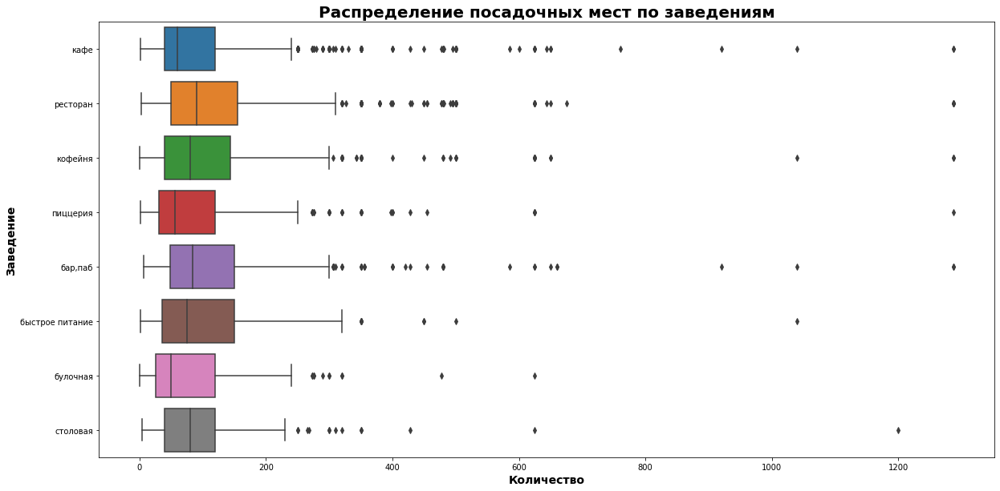

In [52]:
plt.figure(figsize=(20,10))

sns.boxplot(x='seats', y='category', data=places)

plt.title('Распределение посадочных мест по заведениям', fontsize=20, fontweight="bold")
plt.xlabel('Количество', fontsize=14, fontweight="bold")
plt.ylabel('Заведение', fontsize=14, fontweight="bold");

Медианное значение по категориям варьируется от 50 до 90 посадочных мест.

#### Построим график распределения по количеству посадочных мест, в качестве аргумента выберем медианное значение.

In [53]:
fig = px.bar(seats_desc.sort_values(by='50%', ascending=True), 
             x='50%', 
             y='category', 
             text='50%'        
            )

fig.update_layout(title='Количество посадочных мест',
                   xaxis_title='Медианное значение',
                   yaxis_title='Категория заведения')
fig.show() 

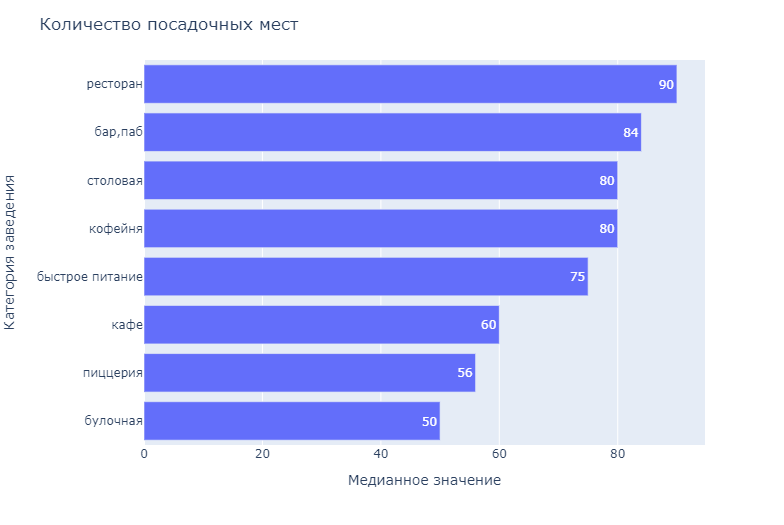

Если смотреть в разрезе медианного значения, то большинство посадочных мест в ресторанах, барах, столовых и кофейнях, меньше всего - в булочных и пиццериях. 

#### Промежуточный вывод
Количество посадочных мест в разрезе по категориям заведений:
- большая часть заведений в дф представлены с количеством посадочных мест от 40 до 141, с медианным значением 78. Заведения с посадочными местами свыше 300 - редкость. 
- максимальное значение - 1288 (ресторан, бар, кофейня, кафе, пиццерия)
- минимальное значение - 1 (быстрое питание, кафе, пиццерия)
- медианное значение варьируется от 52 (булочная) до 90 (ресторан)
- медианное значение существенно отличается от среднего значения, а также высокий показатель стандартного отклонения, что говорит о сильных разбросах в данных.  
- выделяется показатель минимального значения по ряду категорий заведений (ресторан с 2-мя посадочными местами и пр.), что, возможно, указывает на наличие неточностей в данных.

### Анализ соотношения сетевых к несетевым заведениям

In [54]:
places_chain = pd.DataFrame(places['chain'].value_counts()).reset_index()

places_chain.columns = ['chain', 'count']
places_chain['share, %'] = round(100 * places_chain['count'] / len(places), 1)
places_chain

,chain,count,"share, %"
0,несетевое,5196,61.9
1,сетевое,3203,38.1


In [55]:
fig = go.Figure(data=[go.Pie(labels=places_chain['chain'], values=places_chain['count'])]);

fig.update_layout(title='Доля сетевых и несетевых заведений',
                 width=600,
                 height=400)
fig.show()

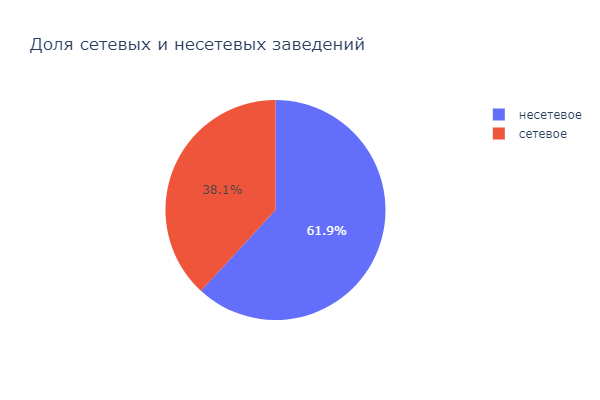

Несетевых заведений - 61,9%, сетевых - 38,1%.

### Анализ категорий заведений, которые чаще являются сетевыми

#### Количество и доля сетевых заведений по категориям

In [56]:
# посчитаем долю сетевых заведений по категориям
places_chain_cat = (
    places
    .pivot_table(index='category', columns= 'chain', aggfunc= {'address':'count'})
    .reset_index()
)
places_chain_cat.columns = ['category', 'non_chain', 'chain']
places_chain_cat['total_count'] = places_chain_cat['non_chain'] + places_chain_cat['chain']
places_chain_cat['share_chain, %'] = (
    round(100 * places_chain_cat['chain'] / places_chain_cat['total_count'], 1)
)
places_chain_cat.sort_values(by='share_chain, %', ascending= False)

,category,non_chain,chain,total_count,"share_chain, %"
1,булочная,99,157,256,61.3
5,пиццерия,303,330,633,52.1
4,кофейня,693,720,1413,51.0
2,быстрое питание,370,232,602,38.5
6,ресторан,1311,728,2039,35.7
3,кафе,1597,779,2376,32.8
7,столовая,227,88,315,27.9
0,"бар,паб",596,169,765,22.1


#### График распределения заведений, которые чаще бывают сетевыми

In [57]:
fig = px.bar(places_chain_cat.sort_values(by='share_chain, %', ascending=True), 
             x='share_chain, %', 
             y='category', 
             text=places_chain_cat.sort_values(by='share_chain, %', ascending=True)['share_chain, %'].apply(lambda x: '{0:1.0f}%'.format(x))        
            )

fig.update_layout(title='Заведения, которые чаще бывают сетевыми',
                   xaxis_title='Доля',
                   yaxis_title='Категория заведения')
fig.show() 

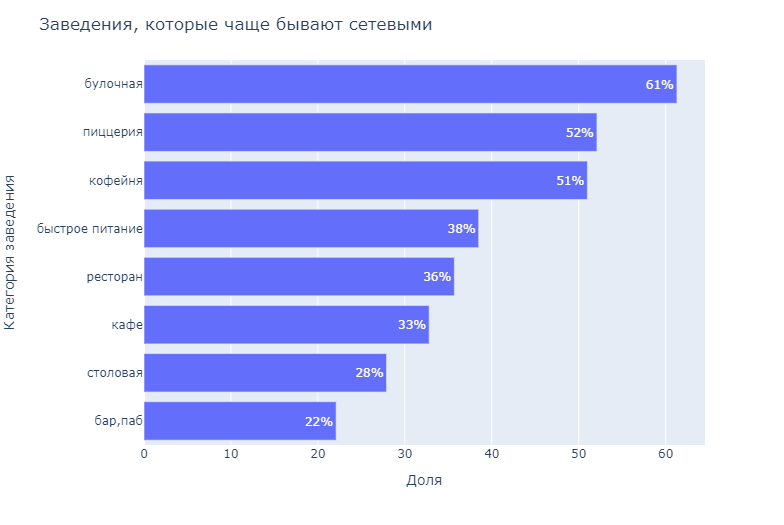

Чаще всего сетевыми бывают булочные, пиццерии и кофейни, реже всего бары.

### Топ-15 популярных сетевых заведений

#### Определим топ-15 популярных сетевых заведений 

In [58]:
chain_top_15 = (
    pd.DataFrame
    (
        places
        .query('chain == "сетевое"')
        .groupby(['name', 'category'])['address']
        .count()
    )
    .reset_index()
)
chain_top_15.columns=['name', 'category', 'count']
chain_top_15 = chain_top_15.sort_values(by='count', ascending=False).head(15).reset_index(drop=True)
chain_top_15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,яндекс лавка,ресторан,72
4,one price coffee,кофейня,71
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


#### Построим график распределения топ 15 сетевых заведений.

In [59]:
fig = px.bar(chain_top_15.sort_values(by='count', ascending=True), 
             x='count', 
             y='name', 
             text='count'        
            )

fig.update_layout(title='Топ 15 сетевых заведений',
                   xaxis_title='Количество',
                   yaxis_title='Название заведения')
fig.show() 

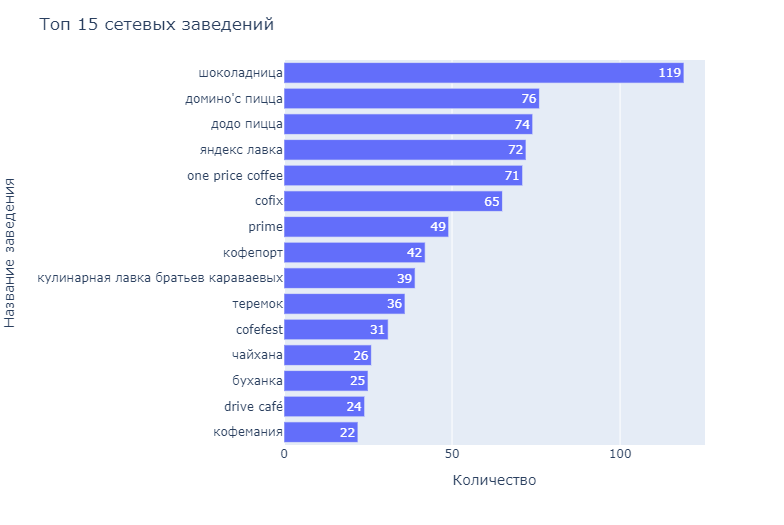

Определим к каким категориям относятся данные заведения.

In [60]:
chain_top_15['category'].value_counts()

кофейня     6
кафе        3
ресторан    3
пиццерия    2
булочная    1
Name: category, dtype: int64

#### Средний чек в топ 15 сетевых заведений.

Создадим дф только с топ 15 сетевыми заведениями.

In [61]:
chain_top_list = chain_top_15['name'].tolist()
chain_top = places.query('name in @chain_top_list')

Найдем медиану среднего чека.

In [62]:
chain_top_avg_bill = (
    chain_top
    .pivot_table(index='name', values='middle_avg_bill', aggfunc=['count', 'median'])
    .reset_index()
)
chain_top_avg_bill.columns = ['name', 'count', 'median']
chain_top_avg_bill = (
    chain_top_avg_bill
    .fillna(0)
    .sort_values(by='median', ascending=False)
    .round()
    .reset_index(drop=True)
)
chain_top_avg_bill

,name,count,median
0,кофемания,15,2000.0
1,шоколадница,12,650.0
2,cofefest,2,512.0
3,домино'с пицца,35,500.0
4,кулинарная лавка братьев караваевых,29,450.0
5,чайхана,13,400.0
6,додо пицца,72,392.0
7,теремок,23,325.0
8,prime,25,300.0
9,буханка,4,238.0


In [63]:
fig = px.bar(chain_top_avg_bill.sort_values(by='median', ascending=True), 
             x='median', 
             y='name', 
             text='median'        
            )

fig.update_layout(title='Медиана среднего чека в топ 15 сетевых заведениях',
                   xaxis_title='Средний чек',
                   yaxis_title='Название заведения')
fig.show() 

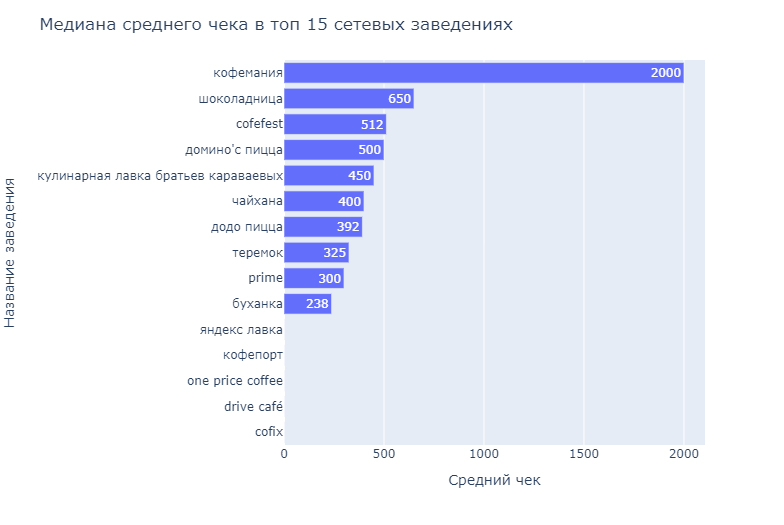

Самый высокий средний чек (медиана) - у сети кофемания, у остальных сетей варьируется от 238 до 650.  
По 5 сетям не представлено ни одного среднего чека.  
В заведениях cofefest и буханка предоставлено мало информации по средним чекам, т.ч. показатели по данным заведениям не являются репрезентативными.  
У наиболее популярных сетевых заведений 'бюджетный' средний чек.

#### Промежуточный вывод

Лидером по открытым заведениям является сеть Шоколадница, менее всего заведений у Кофемания.  
В топ 15 сетевых заведений входят 6 сетей кафе, по 3 сетевых заведения относятся к "кофейни" и "ресторан", 2 "пиццерии" и 1 булочная.  
Данные заведения объединяет расчет на массового посетителя с "бюджетным" средним чеком.  
Prime, Яндекс Лавка и Теремок, ближе подходят к категории кафе, чем ресторан.  

### Определим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. 

#### Количество заведений в каждом районе

In [64]:
places['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             897
Южный административный округ                892
Северо-Восточный административный округ     889
Западный административный округ             850
Восточный административный округ            797
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

#### График распределения заведений по округам

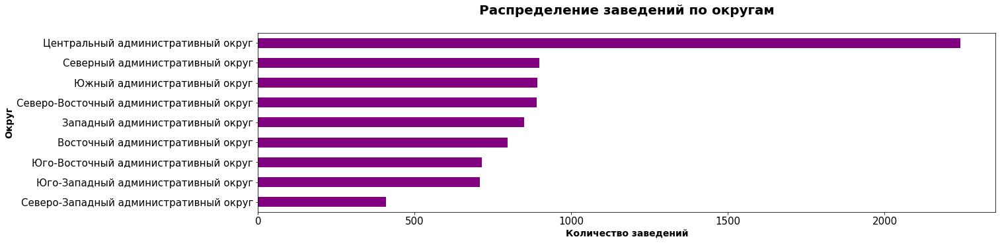

In [65]:
(
    places['district']
    .value_counts(ascending = True)
    .plot(kind = 'barh', figsize = (20,5), legend = False, fontsize = 15, color = 'purple')
    .set_title('Распределение заведений по округам' + "\n", fontsize = 20, fontweight="bold")
)

plt.xlabel('Количество заведений', fontsize=14, fontweight="bold")
plt.ylabel('Округ', fontsize=14, fontweight="bold");

#### График распределения заведений по округам и категориям.

Создадим датасет с количеством заведений по округам и категориям.

In [66]:
places_district = (
    pd.DataFrame
    (
        places
        .pivot_table(index=['district', 'category'], aggfunc={'category':'count'})
    )
)
places_district.columns = ['count']
places_district = places_district.reset_index()

Построим график распределения заведений по округам и категориям.

In [67]:
fig = px.bar(places_district, 
             x='count', 
             y= 'district', 
             title = 'Заведения по округам', 
             color='category', barmode='stack',
            template = 'simple_white')

fig.update_layout(xaxis_title = 'Административнй округ',
                  yaxis_title = 'Количество заведений',
                  )
fig.update_yaxes()
fig.show()

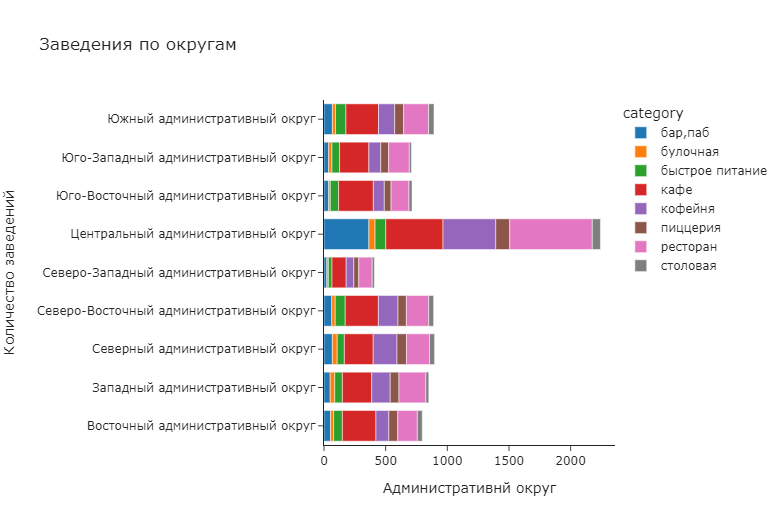

В датасете представлены заведения из 9 районов.  
Больше всего заведений в ЦАО (2242), менее всего СЗАО (409).  
ЦАО существенно опережает остальные районы практически по всем категориям заведений, особенно в категориях рестораны, кафе, кофейня и бар.

### График распределения средних рейтингов по категориям заведений. 

Определим рейтинги заведений по категориям

In [68]:
cat_rating = round(
    places
    .groupby('category')['rating']
    .describe().sort_values(by='mean', ascending=False)
    ,1).reset_index()


cat_rating

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",765.0,4.4,0.4,1.1,4.3,4.4,4.6,5.0
1,пиццерия,633.0,4.3,0.3,1.0,4.2,4.3,4.4,5.0
2,ресторан,2039.0,4.3,0.4,1.0,4.2,4.3,4.5,5.0
3,кофейня,1413.0,4.3,0.4,1.4,4.1,4.3,4.4,5.0
4,булочная,256.0,4.3,0.4,1.3,4.2,4.3,4.4,5.0
5,столовая,315.0,4.2,0.5,1.0,4.1,4.3,4.4,5.0
6,кафе,2376.0,4.1,0.6,1.0,4.0,4.2,4.4,5.0
7,быстрое питание,602.0,4.1,0.6,1.1,3.9,4.2,4.3,5.0


Максимальный рейтинг 5, минимальный - 1.  
Средние рейтинги практически совпадают с медианным значением.  
Мединные значения рейтингов по категориям заведений незначительно различаются, варьируются от 4.2 до 4.4 

Построим график распределения рейтингов заведений по категориям.

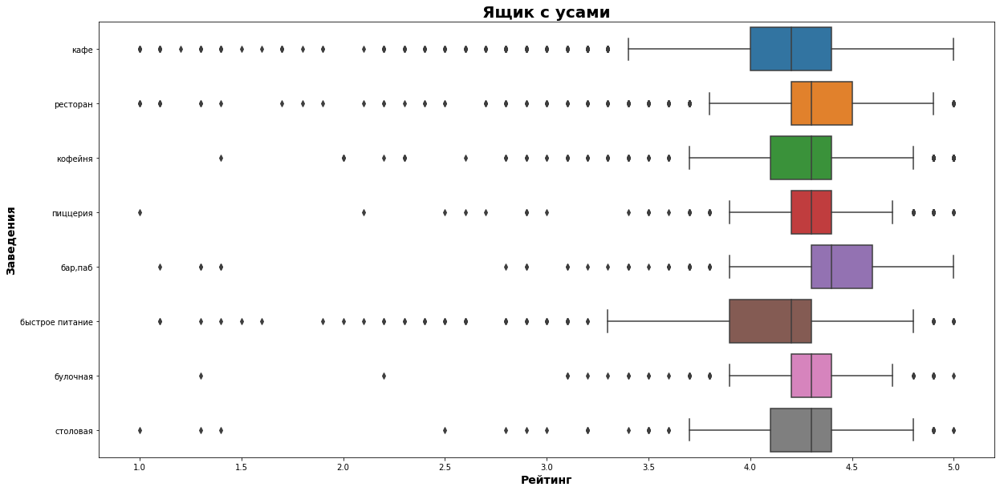

In [69]:
plt.figure(figsize=(20,10))

sns.boxplot(x='rating', y='category', data=places)

plt.title('Ящик с усами', fontsize=20, fontweight="bold")
plt.xlabel('Рейтинг', fontsize=14, fontweight="bold")
plt.ylabel('Заведения', fontsize=14, fontweight="bold");

Максимальный рейтинг заведений - 5, минимальный - 1.  
Мединные значения рейтингов по категориям заведений незначительно различаются, варьируются от 4.2 до 4.4 
Наиболее высокие рейтинги у баров и кафе, у остальных категорий максимальный рейтинг заведений воспринимается как редке значение.  
Заведения из категории кафе, рестораны и объекты быстрого питания больше больше остальных получали низкий рейтинг.  

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.  

Сгруппируем дф по округам и определим средний рейтинг.

In [70]:
district_rating = (
    places
    .pivot_table(index='district', values='rating', aggfunc=['mean', 'median'])
    .reset_index()
)
district_rating.columns = ['district', 'mean_rating', 'median_rating']
district_rating = (
    district_rating.round(1)
    .sort_values(by='mean_rating', ascending=False)
    .reset_index(drop=True)
)
district_rating

,district,mean_rating,median_rating
0,Центральный административный округ,4.4,4.4
1,Восточный административный округ,4.2,4.3
2,Западный административный округ,4.2,4.3
3,Северный административный округ,4.2,4.3
4,Северо-Западный административный округ,4.2,4.3
5,Юго-Западный административный округ,4.2,4.3
6,Южный административный округ,4.2,4.3
7,Северо-Восточный административный округ,4.1,4.2
8,Юго-Восточный административный округ,4.1,4.2


Построим фоновую картограмму.

In [71]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'median_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Лучший рейтинг у заведений, расположенных в ЦАО, худший у заведений в СВАО и ЮВАО.  
Но в целом, медианные рейтинги варьируются по округам незначительно.

### Отобразим все заведения датасета на карте с помощью кластеров. 

In [72]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

### Определим топ-15 улиц по количеству заведений. 

In [73]:
top_15_street = (
    pd.DataFrame
    (
        places
        .query('street != "улица не определена"')
        .groupby(['street'])['address']
        .count()
    )
    .reset_index()
)
top_15_street.columns=['street', 'count']
top_15_street = top_15_street.sort_values(by='count', ascending=False).head(15).reset_index(drop=True)
top_15_street

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,75
8,ленинградское шоссе,69
9,мкад,65


In [74]:
fig = px.bar(top_15_street.sort_values(by='count', ascending=True), 
             x='count', 
             y='street', 
             text='count'        
            )

fig.update_layout(title='Топ 15 улиц по количеству заведений',
                   xaxis_title='Количество',
                   yaxis_title='Улица')
fig.show() 

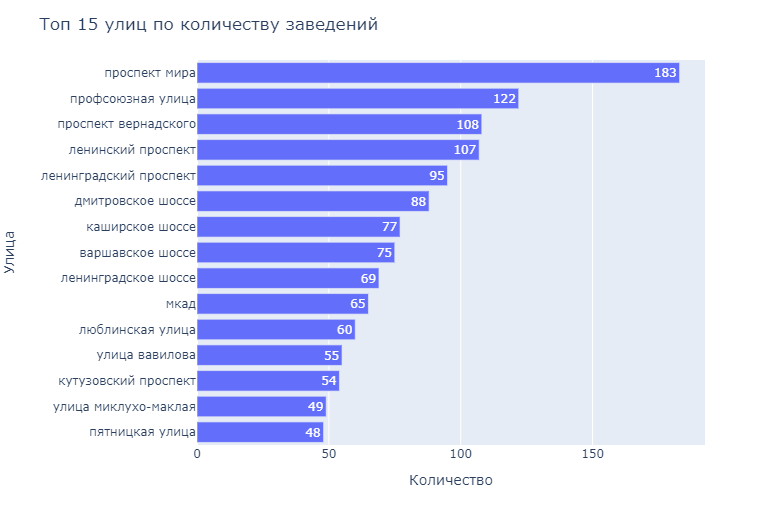

Лидером по количеству заведений является Проспект Мира.  
Из 15 улиц на 4-х расположено более 100 заведений.  
Стоит отметить, что лидирующие позиции занимают наиболее протяженные магистрали города.

#### Категории заведений, расположеные на данных улицах.

Создадим дф, который содержит только улицы из списка "топ-15 улиц".

In [75]:
top_st_list = top_15_street['street'].tolist()
top_st = places.query('street in @top_st_list')

top_st['street'].nunique()

15

ДФ содержит нужные нам 15 улиц.

Определим количество заведений каждой категории на данных улицах.

In [76]:
top_st_cat = pd.DataFrame(top_st.pivot_table(index=['street', 'category'], aggfunc={'name':'count'}))
top_st_cat.columns = ['count']
top_st_cat = top_st_cat.reset_index()
top_st_cat.head()

,street,category,count
0,варшавское шоссе,"бар,паб",6
1,варшавское шоссе,быстрое питание,7
2,варшавское шоссе,кафе,17
3,варшавское шоссе,кофейня,14
4,варшавское шоссе,пиццерия,4


Построим график распределения по категориям.

In [77]:
fig = px.bar(top_st_cat, 
             x='count', 
             y= 'street', 
             title = 'Распределение заведений по категориям на топ 15 улицах', 
             color='category', barmode='stack',
            template = 'simple_white')

fig.update_layout(xaxis_title = 'Количество заведений',
                  yaxis_title = 'Улица',
                  width=800,
                  height=500)

fig.show()

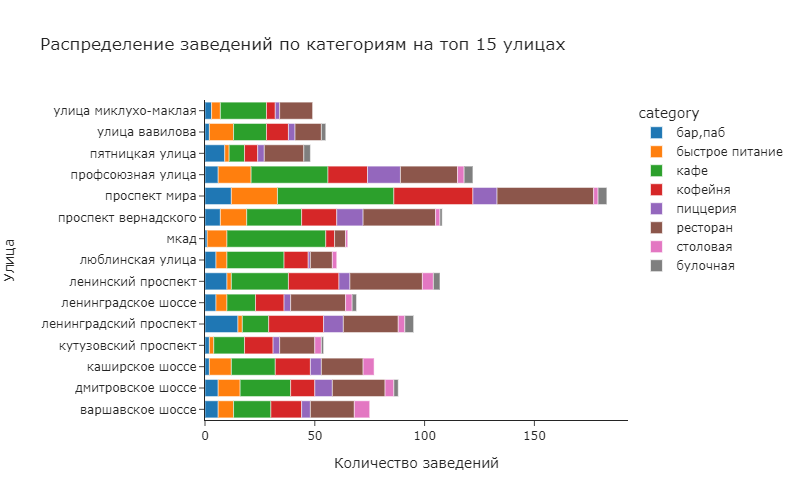

Лидером по количеству заведений является Проспект Мира.  
Из 15 улиц на 4-х расположено более 100 заведений.  
Лидирующие позиции занимают наиболее протяженные магистрали города. <br>
В разрезе категорий заведений на топ 15 улицах - на Проспекте Мира расположено больше всего ресторанов, кофейн, кафе и объектов быстрого питания, если сравнивать с остальными улицами из топ 15.

### Определим улицы, на которых находится только один объект общепита.

Создадим дф с улицами, на которых располагается только одно заведение

In [78]:
str_1_pl_list = (
    places['street']
    .value_counts()
    .reset_index()
    .query('street == 1')['index']
    .tolist()
)

str_1_pl = places.query('street in @str_1_pl_list')

print(str_1_pl['street'].count())

402


На 402 улицах, расположено только одно заведение.

Определим количество таких улиц в каждом округе.

In [79]:
cnt_str = str_1_pl['district'].value_counts().reset_index()
cnt_str.columns = ['district', 'count']
cnt_str

,district,count
0,Центральный административный округ,131
1,Северо-Восточный административный округ,50
2,Восточный административный округ,42
3,Северный административный округ,40
4,Западный административный округ,38
5,Южный административный округ,34
6,Юго-Восточный административный округ,33
7,Юго-Западный административный округ,17
8,Северо-Западный административный округ,17


Построим график распределения улиц с одним заведение по округам.

In [80]:
fig = px.bar(cnt_str.sort_values(by='count', ascending=True), 
             x='count', 
             y='district', 
             text='count'        
            )

fig.update_layout(title='Распределение улиц с одним заведением по округам',
                   xaxis_title='Количество',
                   yaxis_title='Округ')
fig.show() 

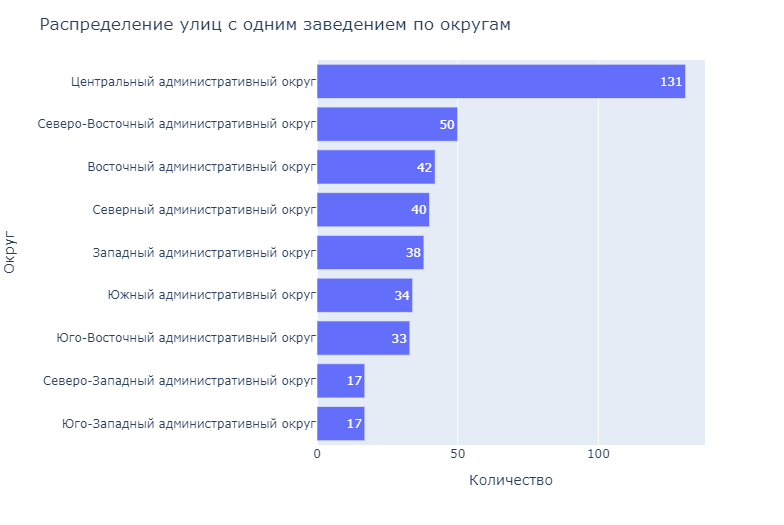

ЦАО существенно опережает остальные округа по количеству улиц с одним заведением (131), в ЮЗАО и СЗАО меньше всего таких улиц (17).

Построим график распределения улиц с одним заведение по округам и категориям.

Сгруппируем дф по округам и категориям заведений.

In [81]:
st_1_pl_cat = pd.DataFrame(str_1_pl.pivot_table(index=['district', 'category'], aggfunc={'name':'count'}))
st_1_pl_cat.columns = ['count']
st_1_pl_cat = st_1_pl_cat.reset_index()
st_1_pl_cat.head()

,district,category,count
0,Восточный административный округ,"бар,паб",3
1,Восточный административный округ,булочная,1
2,Восточный административный округ,быстрое питание,3
3,Восточный административный округ,кафе,13
4,Восточный административный округ,кофейня,7


Построим график распределения заведений по категориям на улицах с одним заведением.

In [82]:
fig = px.bar(st_1_pl_cat, 
             x='count', 
             y= 'district', 
             title = 'Распределение заведений по категориям на улицах с одним заведением', 
             color='category', barmode='stack',
            template = 'simple_white')

fig.update_layout(xaxis_title = 'Количество заведений',
                  yaxis_title = 'Округ',
                  width=800,
                  height=500)

fig.show()

 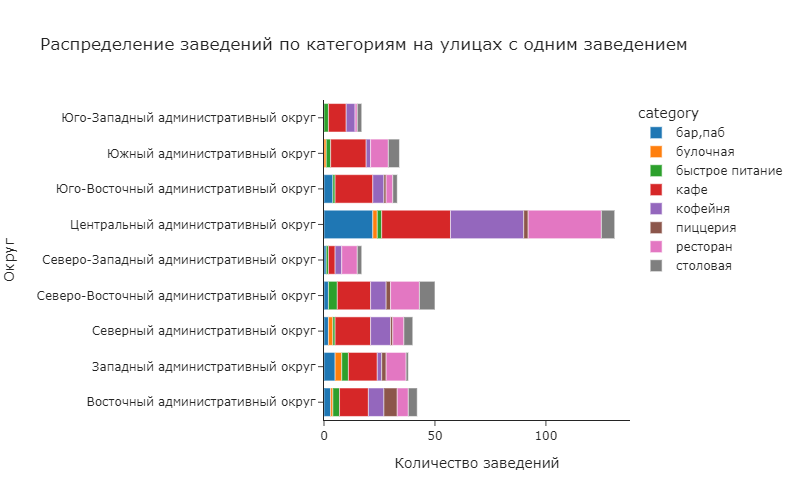

На 402 улицах, расположено только одно заведение.  
ЦАО существенно опережает остальные округа по количеству улиц с одним заведением (131), в ЮЗАО и СЗАО меньше всего таких улиц (17).  
В ЦАО в разрезе категорий выделяются рестораны, кофейня, кафе и бары. 

### Определим медиану значений средних чеков заведений для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в округах. 

Посмотрим описательную статистику по столбцу middle_avg_bill.

In [83]:
round(places['middle_avg_bill'].describe())

count     3148.0
mean       958.0
std       1010.0
min         30.0
25%        375.0
50%        750.0
75%       1250.0
max      35000.0
Name: middle_avg_bill, dtype: float64

По 3148 заведениям значение среднего чека:  
Минимальное - 30  
Максимальное - 35 000  
Среднее - 958  
Медиана - 750

#### Средний чек по категориям заведений

Посмотрим описательную статистику значений среднего чека в разрезе по категориям. 

In [84]:
round(
    places
    .groupby('category')['middle_avg_bill']
    .describe().sort_values(by='50%', ascending=False)
)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",349.0,1339.0,886.0,150.0,925.0,1250.0,1750.0,11000.0
ресторан,1040.0,1368.0,1415.0,120.0,669.0,1250.0,1750.0,35000.0
пиццерия,395.0,789.0,518.0,150.0,424.0,600.0,1000.0,3000.0
кафе,694.0,708.0,505.0,67.0,350.0,550.0,1000.0,4500.0
булочная,53.0,659.0,599.0,50.0,285.0,450.0,750.0,2500.0
кофейня,199.0,617.0,500.0,50.0,300.0,400.0,750.0,2500.0
быстрое питание,237.0,446.0,456.0,30.0,275.0,375.0,500.0,5500.0
столовая,181.0,335.0,289.0,125.0,250.0,300.0,330.0,3750.0


Значения среднего чека по категориям распределены следующим образом: 
- максимальное - у ресторана (35000), затем идет бар (11000), остальные заведения от 2500 до 5500
- минимальное - у объектов быстрого питания (30), немного больше мин.средний чек у кафе, булочной и кофейни (50-67), у остальных заведений в пределах 120-150  
- медианное - самое высокое у ресторанов и баров (1250), самое низкое значение у столовых.

Построим график распределения медианного значения среднего чека по категориям.

In [85]:
fig = px.bar(
    round(
    places
    .groupby('category')['middle_avg_bill']
    .describe()
    )
    .reset_index()
    .sort_values(by='50%', ascending=True), 
             x='50%', 
             y='category', 
             text='50%'        
            )

fig.update_layout(title='Медианное значение среднего чека по категориям заведений',
                   xaxis_title='Средний чек',
                   yaxis_title='Категория')
fig.show() 

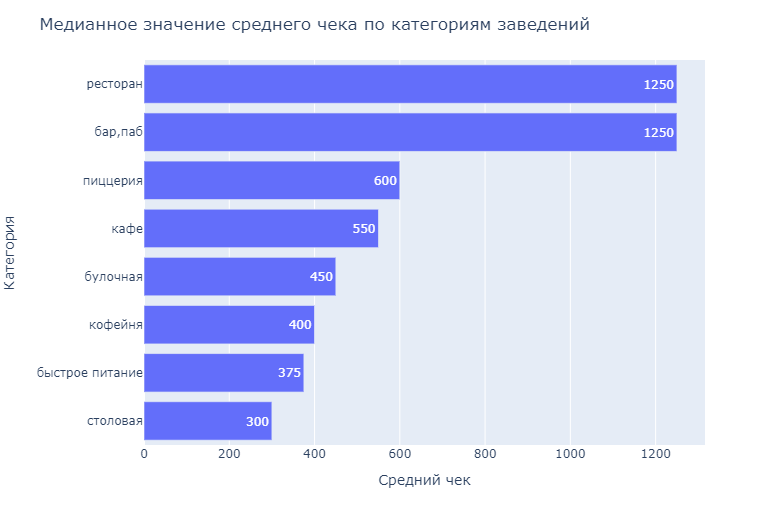

Построим график ящик с усами с категориями заведений.

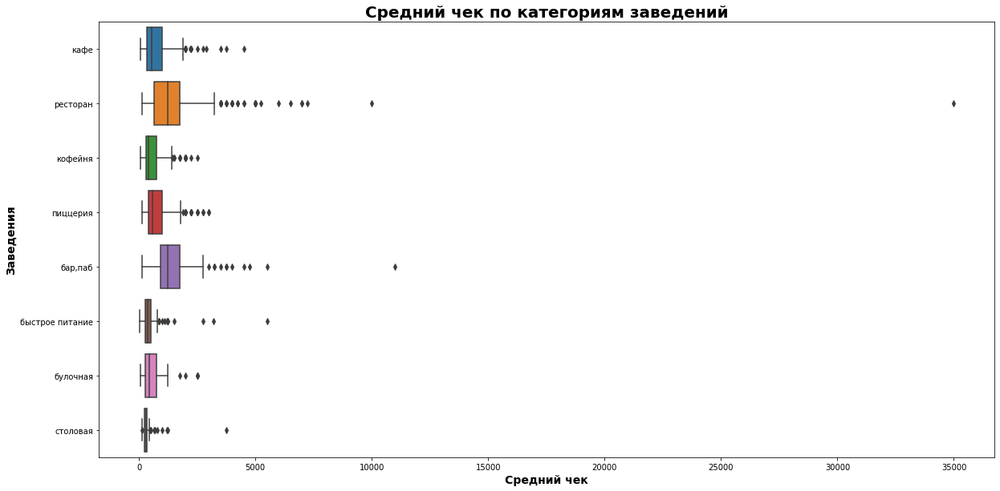

In [86]:
plt.figure(figsize=(20,10))

sns.boxplot(x=places['middle_avg_bill'], y=places['category'], data=places)

plt.title('Средний чек по категориям заведений', fontsize=20, fontweight="bold")
plt.xlabel('Средний чек', fontsize=14, fontweight="bold")
plt.ylabel('Заведения', fontsize=14, fontweight="bold");

Средний чек более 10 000 встречается несколько раз, для информативности ограничим значение среднего чека до 8000.

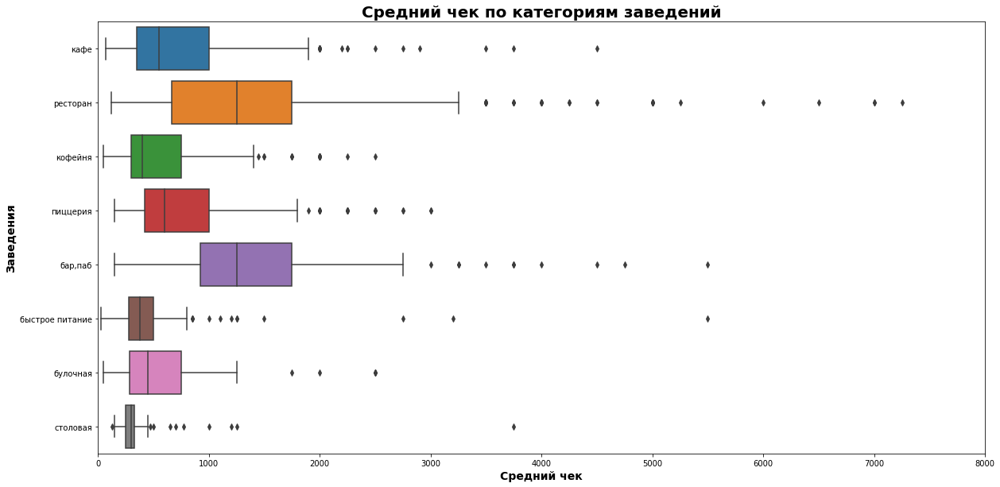

In [87]:
plt.figure(figsize=(20,10))

sns.boxplot(x=places['middle_avg_bill'], y=places['category'], data=places)

plt.title('Средний чек по категориям заведений', fontsize=20, fontweight="bold")
plt.xlabel('Средний чек', fontsize=14, fontweight="bold")
plt.ylabel('Заведения', fontsize=14, fontweight="bold")

plt.xlim(0,8000);

В разрезе категорий заведений:  
- в ресторанах средний чек выше, чем в остальных заведениях.  
- в столовых средений чек ниже, чем в остальных заведениях.

#### Средний чек по округам

Посмотрим описательную статистику значений среднего чека в разрезе по округам.

In [88]:
dist_avg_bill = round(
    places
    .groupby('district')['middle_avg_bill']
    .describe().sort_values(by='50%', ascending=False)
).reset_index()
dist_avg_bill = dist_avg_bill.rename(columns = {'50%':'median'})
dist_avg_bill
# добавим столбец индикатор медианного значения среднего чека ("индекс среднего чека по округам")
# показывающий насколько % медиана среднего чека каждого округа
# ниже относительно самого высокого значения
# так определим насколько медиана среднего чека в районах отличается от ЦАО (самого дорогого округа)
dist_avg_bill['avg_bill_index, %'] = (
    round(100 * (dist_avg_bill['median'] / dist_avg_bill['median'].iloc[0] - 1))
)

dist_avg_bill

,district,count,mean,std,min,25%,median,75%,max,"avg_bill_index, %"
0,Западный административный округ,306.0,1053.0,779.0,50.0,428.0,1000.0,1500.0,5250.0,0.0
1,Центральный административный округ,1059.0,1192.0,920.0,67.0,500.0,1000.0,1500.0,7250.0,0.0
2,Северо-Западный административный округ,157.0,822.0,595.0,120.0,340.0,700.0,1100.0,2900.0,-30.0
3,Северный административный округ,322.0,928.0,913.0,130.0,350.0,650.0,1250.0,11000.0,-35.0
4,Юго-Западный административный округ,235.0,793.0,559.0,100.0,350.0,600.0,1100.0,2750.0,-40.0
5,Восточный административный округ,260.0,821.0,851.0,50.0,338.0,575.0,1100.0,10000.0,-43.0
6,Северо-Восточный административный округ,301.0,717.0,591.0,50.0,325.0,500.0,950.0,4500.0,-50.0
7,Южный административный округ,314.0,834.0,2009.0,100.0,350.0,500.0,1038.0,35000.0,-50.0
8,Юго-Восточный административный округ,194.0,654.0,567.0,30.0,281.0,450.0,888.0,3750.0,-55.0


Значения среднего чека по округам распределены следующим образом: 
- максимальное - в ЮАО
- минимальное - в ЮВАО  
- медианное - самое высокое в ЦАО и ЗАО, самое низкое значение в ЮВАО.

Построим график ящик с усами с категориями заведений, ограничим значения среднего чека до 8000 для информативности.

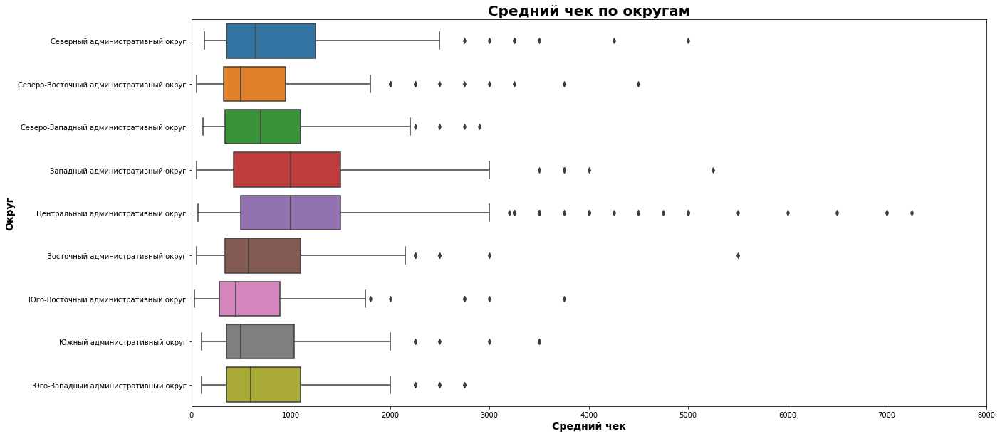

In [89]:
plt.figure(figsize=(20,10))

sns.boxplot(x=places['middle_avg_bill'], y=places['district'], data=places)

plt.title('Средний чек по округам', fontsize=20, fontweight="bold")
plt.xlabel('Средний чек', fontsize=14, fontweight="bold")
plt.ylabel('Округ', fontsize=14, fontweight="bold")

plt.xlim(0,8000);

В ЦАО средний чек выше, чем в остальных округах, в ЮВАО ниже.

Построим график распределения медианного значения среднего чека по округам.

In [90]:
fig = px.bar(dist_avg_bill
        .sort_values(by='median', ascending=True), 
             x='median', 
             y='district', 
             text='median'        
            )

fig.update_layout(title='Медианное значение среднего чека по округам',
                   xaxis_title='Средний чек',
                   yaxis_title='Округ')
fig.show() 

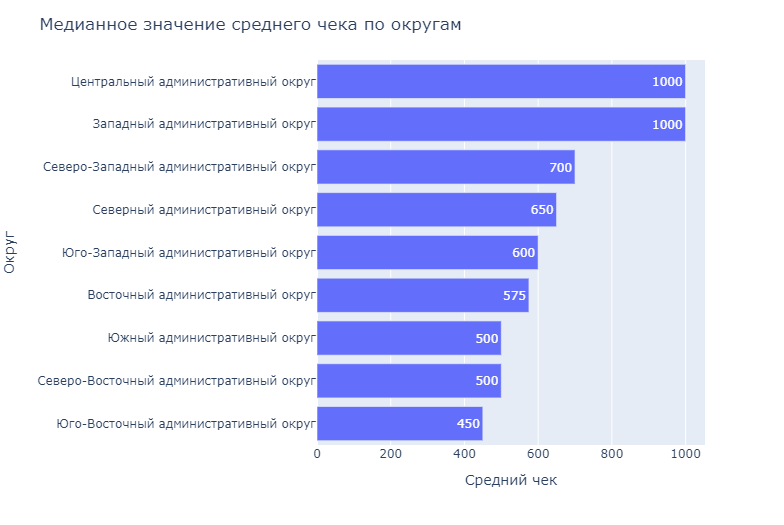

Построим график распределения отношения медианного значения среднего чека по округам.

In [91]:
fig = px.bar(dist_avg_bill
        .sort_values(by='avg_bill_index, %', ascending = False), 
             x='avg_bill_index, %', 
             y='district', 
             text= dist_avg_bill['avg_bill_index, %'].apply(lambda x: '{0:1.0f}%'.format(x))        
            )

fig.update_layout(title='Различие в медианном значении среднего чека относительно ЦАО',
                   xaxis_title='Отношение медианы среднего чека',
                   yaxis_title='Округ')
fig.show() 

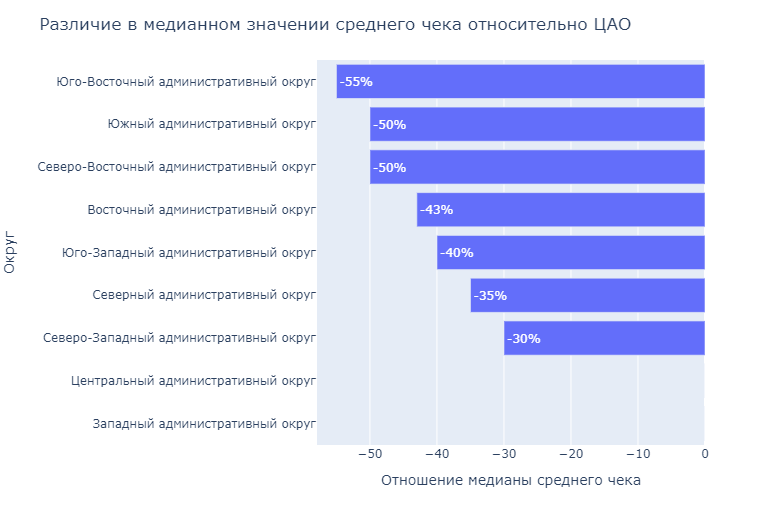

Построили распределение медианного значения среднего чека по округам к ЦАО:  
- в ЦАО И ЗАО медианные значения равны.  
- в остальных районах медиана среднего чека ниже на 30-55%%.  
- самое низкое значение - в ЮВАО (-55%). 

#### Построим фоновую картограмму со значениями среднего чека для каждого округа

In [92]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианное значение среднего чека заведений по округам',
).add_to(m)

# выводим карту
m

#### Промежуточный вывод

По 3148 заведениям значение среднего чека:
В разрезе по категориям:
- минимальное - 30, максимальное - 35 000
- среднее - 958, медиана - 750
- самое высокое медианное значение у ресторанов и баров (1250), самое низкое значение у столовых.
- в ресторанах средний чек выше, чем у остальных заведений.  
- в столовых средений чек ниже, чем у остальных заведений.
В разрезе по округам:
- медианное значение самое высокое в ЦАО и ЗАО, самое низкое значение в ЮВАО.
- в ЦАО средний чек выше, чем в остальных округах, в ЮВАО ниже.
- в ЦАО И ЗАО медианные значения равны, в остальных районах медиана среднего чека ниже на 30-55%%.
- самое низкое значение - в ЮВАО (-55%).

<a id='EDA_res'></a>
### Вывод по анализу данных

**Категории:** 
- практически 70% всех заведений в датасете представлено 3 видами (кафе - 2376, ресторан - 2039, кофейня - 1413)
- ориентировочно 24% приходится на категории бар (765), пиццерия (633), быстрое питание (602) 
- меньше всего заведений (почти 7%) приходится на булочные (256) и столовые (315).

**Посадочные места:**
- большая часть заведений в дф представлены с количеством посадочных мест от 40 до 140, с медианным значением 78. Заведения с посадочными местами свыше 300 - редкость. 
- максимальное значение - 1288 (в категориях ресторан, бар, кофейня, кафе, пиццерия), минимальное значение - 1 (в категориях быстрое питание, кафе, пиццерия)
- медианное значение в зависимости от категории заведения варьируется от 50 (булочная) до 90 (ресторан)
- медианное значение существенно отличается от среднего значения, а также высокий показатель стандартного отклонения, что говорит о сильных разбросах в заведениях по посадочным местам.  

**Сетевые заведения:**
- несетевых заведений - 61,9%, сетевых - 38,1%.
- чаще всего сетевыми бывают булочные, пиццерии и кофейни, реже всего бары.
- лидером по количеству точек является сеть Шоколадница (119), менее всего заведений у Кофемания (22).  
- в топ 15 сетевых заведений входят 6 сетей кафе, по 3 сетевых заведения относятся к "кофейни" и "ресторан", 2 "пиццерии" и 1 булочная.  
- средний чек (медиана) варьируется от 238 до 2000. 
- в основном популярные сетевые заведения расчитаны на массового посетителя c 'бюджетным' средним чеком.

**Локация:**
- в датасете представлены заведения из 9 районов, больше всего заведений в ЦАО (2242), менее всего СЗАО (409).
- ЦАО существенно опережает остальные районы практически по всем категориям заведений, особенно в категориях рестораны, кафе, кофейня и бар.
- лидером по количеству заведений является Проспект Мира.
- из 15 улиц на 4-х расположено более 100 заведений.
- лидирующие позиции занимают наиболее протяженные магистрали города.
- на Проспекте Мира расположено больше всего ресторанов, кофейн, кафе и объектов быстрого питания, если сравнивать с остальными улицами из топ 15.
- на 402 улицах, расположено только одно заведение.
- ЦАО существенно опережает остальные округа по количеству улиц с одним заведением (131), на которых в основном расположены рестораны, кофейни, кафе и бары
- в ЮЗАО и СЗАО меньше всего улиц с одним заведением.

**Рейтинги заведений:**
- максимальный рейтинг 5, минимальный - 1.
- мединные значения рейтингов по категориям заведений незначительно различаются, варьируются от 4.2 до 4.4 
- наиболее высокие рейтинги у баров и кафе, у остальных категорий максимальный рейтинг заведений воспринимается как редке значение.
- кафе, рестораны и объекты быстрого питания больше остальных получали низкий рейтинг.

**Средний чек:** 
- минимальное - 30, максимальное - 35 000
- среднее - 958, медиана - 750
- самое высокое медианное значение у ресторанов и баров (1250), самое низкое значение у столовых.
- в ресторанах средний чек выше, чем у остальных заведений.
- в столовых средений чек ниже, чем у остальных заведений. В разрезе по округам:
- медианное значение самое высокое в ЦАО и ЗАО, самое низкое значение в ЮВАО.
- в ЦАО средний чек выше, чем в остальных округах, в ЮВАО ниже.
- в ЦАО И ЗАО медианные значения равны, в остальных районах медиана среднего чека ниже на 30-55%%.
- самое низкое значение - в ЮВАО (-55%).<br>

Стоит отметить, что анализ среднего чека проводился по ~37% заведениям дф, по остальным заведениям информация о среднем чеке отсутствует. 

**ЦАО лидирует по многим критериям, что не удивительно, поскольку ЦАО является культурно-деловым центром столицы.**

[в начало](#intro)

<a id='coffee_house'></a>
## Исследование открытия кофейни

Создадаим дф, содержащий только кофейни.

In [93]:
df_cof = places.query('category == "кофейня"')

### Количество кофеен

In [94]:
print('Всего кофеен', len(df_cof))
print('Доля кофеен от всех заведений', "{0:.1%}".format(len(df_cof) / len(places)))

Всего кофеен 1413
Доля кофеен от всех заведений 16.8%


### В каких районах располагаются

In [95]:
df_cof['district'].value_counts()

Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: district, dtype: int64

In [96]:
fig = px.bar(df_cof['district'].value_counts().reset_index()
        .sort_values(by='district', ascending=True), 
             x='district', 
             y='index', 
             text='district'        
            )

fig.update_layout(title='Кофейни по округам',
                   xaxis_title='Количество',
                   yaxis_title='Округ')
fig.show() 

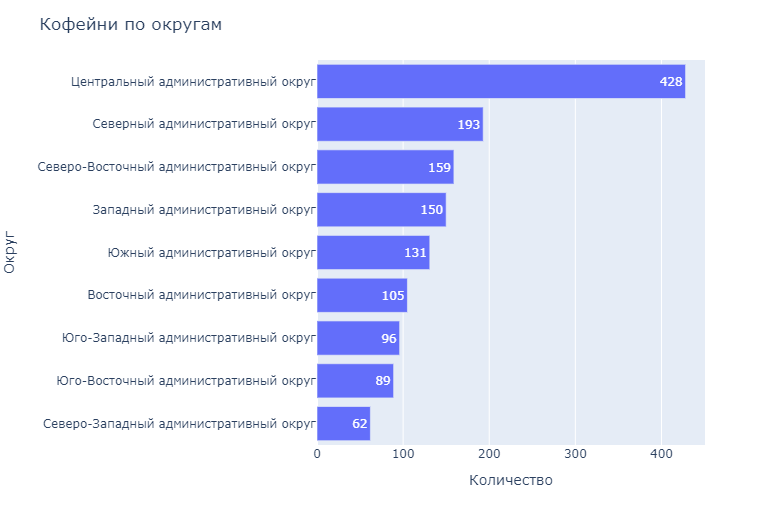

Большинство кофеен в ЦАО, что не удивительно, поскольку ЦАО является культурно-деловым центром столицы.  
Меньше всего кофеен в спальных районах.

### Анализ времени работы заведений

In [97]:
df_cof_24 = (
    df_cof['is_24/7']
    .value_counts()
    .reset_index()
    .rename(columns = {'index':'is_24/7', 'is_24/7':'count'})
)

df_cof_24.loc[df_cof_24['is_24/7'] == False, 'is_24/7'] = 'некруглосуточно'
df_cof_24.loc[df_cof_24['is_24/7'] == True, 'is_24/7'] = 'круглосуточно'

df_cof_24['share, %'] = round(100 * df_cof_24['count'] / len(df_cof), 1) 

df_cof_24

,is_24/7,count,"share, %"
0,некруглосуточно,1354,95.8
1,круглосуточно,59,4.2


Построим круговую диаграмму с соотношением.

In [98]:
fig = go.Figure(data=[go.Pie(labels=df_cof_24['is_24/7'], values=df_cof_24['count'])]);

fig.update_layout(title='Соотношение кофеен по времени работы',
                 width=500,
                 height=400)

fig.show()

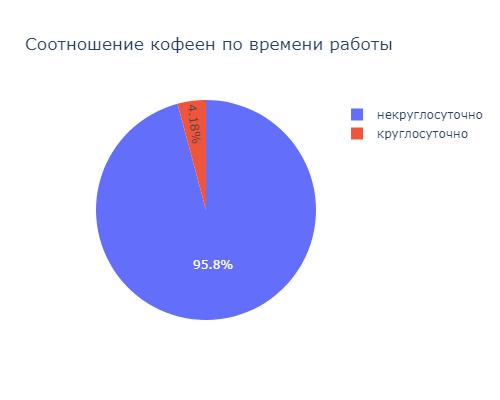

Круглосуточно работает малая доля кофеен (менее 5%).

### Рейтинги кофеен

Посмотрим описательную статистику по столбцу с рейтингами.

In [99]:
round(df_cof['rating'].describe(),1)

count    1413.0
mean        4.3
std         0.4
min         1.4
25%         4.1
50%         4.3
75%         4.4
max         5.0
Name: rating, dtype: float64

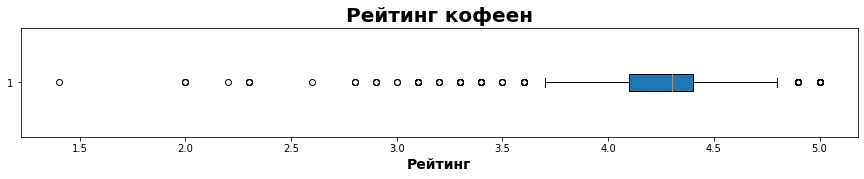

In [100]:
plt.figure(figsize=(15,2))
plt.boxplot(df_cof['rating'], patch_artist=True, vert=0)

plt.title('Рейтинг кофеен', fontsize=20, fontweight="bold")
plt.xlabel('Рейтинг', fontsize=14, fontweight="bold");

Средний рейтинг 4.3.  
Минимальнйы рейтинг - 1, максимальный - 5.  
Рейтинги выше 4.8 и ниже 3.7 редкие (рейтингов ниже 3.7 больше, чем максимальных)

Посмотрим описательную статистику по столбцу с рейтингами по округам.

In [101]:
df_cof_rat = (
    df_cof
    .groupby('district')['rating']
    .describe()
    .reset_index()
    .sort_values(by='50%', ascending=False)
)
df_cof_rat

,district,count,mean,std,min,25%,50%,75%,max
0,Восточный административный округ,105.0,4.282857,0.376077,3.0,4.100,4.3,4.400,5.0
2,Северный административный округ,193.0,4.291710,0.444097,2.0,4.100,4.3,4.500,5.0
3,Северо-Восточный административный округ,159.0,4.216981,0.425487,1.4,4.100,4.3,4.400,5.0
4,Северо-Западный административный округ,62.0,4.325806,0.430377,2.0,4.200,4.3,4.500,5.0
5,Центральный административный округ,428.0,4.336449,0.256948,2.3,4.200,4.3,4.400,5.0
6,Юго-Восточный административный округ,89.0,4.225843,0.514456,2.3,4.100,4.3,4.500,5.0
7,Юго-Западный административный округ,96.0,4.283333,0.304930,3.3,4.100,4.3,4.500,5.0
8,Южный административный округ,131.0,4.232824,0.388576,2.0,4.100,4.3,4.400,5.0
1,Западный административный округ,150.0,4.195333,0.361454,2.3,4.025,4.2,4.375,5.0


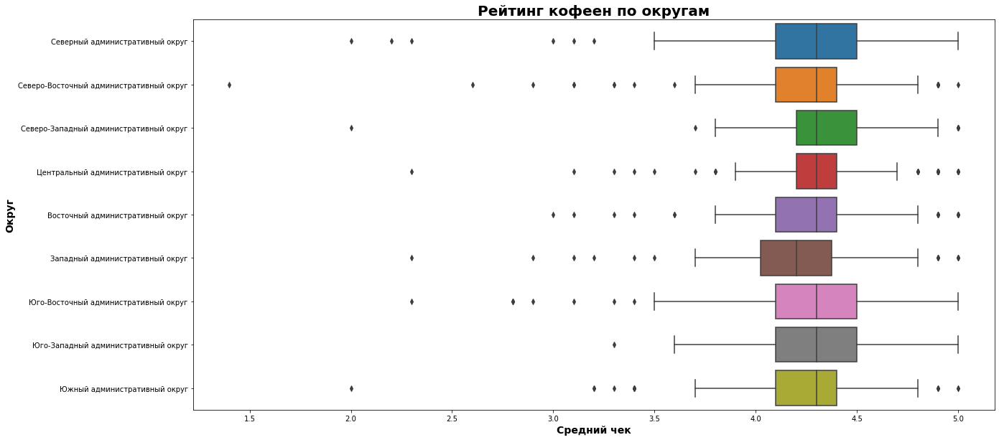

In [102]:
plt.figure(figsize=(20,10))

sns.boxplot(x=df_cof['rating'], y=df_cof['district'], data=df_cof)

plt.title('Рейтинг кофеен по округам', fontsize=20, fontweight="bold")
plt.xlabel('Средний чек', fontsize=14, fontweight="bold")
plt.ylabel('Округ', fontsize=14, fontweight="bold");

Лучшие рейтини у кофеен ЮЗАО, ЮВАО и в САО.  
Меньше всего плохих отзывов в ЮЗАО.

### Стоимость чашки капучино.

In [103]:
round(df_cof['middle_coffee_cup'].describe(),1)

count     521.0
mean      175.1
std        89.8
min        60.0
25%       124.0
50%       170.0
75%       225.0
max      1568.0
Name: middle_coffee_cup, dtype: float64

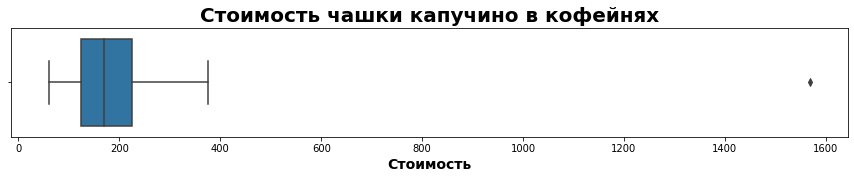

In [104]:
plt.figure(figsize=(15,2))
sns.boxplot(data = df_cof, x=df_cof['middle_coffee_cup'])

plt.title('Стоимость чашки капучино в кофейнях', fontsize=20, fontweight="bold")
plt.xlabel('Стоимость', fontsize=14, fontweight="bold");

Стоимость чашки капучино:
- варьируется от 60 до 400, в большей массе от 124 до 225 
- медианное значение - 170
- единичное значение больше 1500 является аномальным.

Посмотрим стоимость чашки по округам.

In [105]:
round(df_cof.groupby('district')['middle_coffee_cup'].describe(),1)

,count,mean,std,min,25%,50%,75%,max
district,,,,,,,,
Восточный административный округ,42.0,174.0,225.4,60.0,106.2,135.0,177.5,1568.0
Западный административный округ,49.0,189.9,74.2,60.0,130.0,189.0,256.0,300.0
Северный административный округ,76.0,165.8,62.7,60.0,133.0,159.0,204.2,325.0
Северо-Восточный административный округ,60.0,165.3,63.6,60.0,123.0,162.5,201.2,297.0
Северо-Западный административный округ,21.0,165.5,60.8,60.0,124.0,165.0,200.0,270.0
Центральный административный округ,162.0,187.5,67.3,60.0,139.0,190.0,250.0,328.0
Юго-Восточный административный округ,34.0,151.1,62.4,60.0,112.5,147.5,173.8,375.0
Юго-Западный административный округ,34.0,184.2,57.5,95.0,129.0,198.0,229.2,291.0
Южный административный округ,43.0,158.5,66.1,60.0,107.5,150.0,202.5,275.0


Построим ящик с усами, сделаем ограничения от 50 до 400.

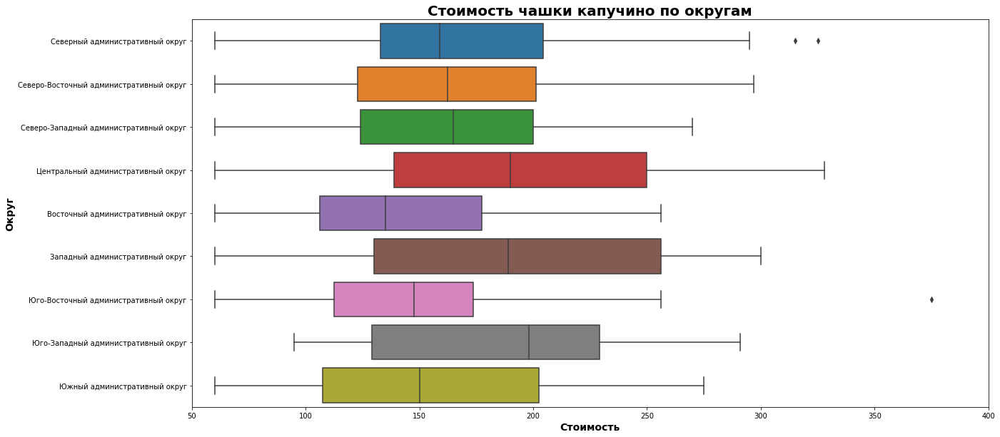

In [106]:
plt.figure(figsize=(20,10))

sns.boxplot(x=df_cof['middle_coffee_cup'], y=df_cof['district'], data=df_cof)

plt.title('Стоимость чашки капучино по округам', fontsize=20, fontweight="bold")
plt.xlabel('Стоимоcть', fontsize=14, fontweight="bold")
plt.ylabel('Округ', fontsize=14, fontweight="bold")
plt.xlim(50,400);

В ЦАО, ЗАО и ЮЗА чашки капучино обходятся дороже, в ВАО дешевле.

<a id='conclusions'></a>
### Выводы и рекомендации по результатам анализа кофеен

# Вывод
Рынок Столицы значительно насыщен кофейнями (3 место среди категорий, не учитывая категорию кафе, часть которых, возможно, также можно отнести к кофейням) в т.ч. сетевыми, что говорит о высокой конкуренции, простоте открытия заведения, но также и любви Москвичей и гостей Столицы к данной категории заведений. 

- кофейни занимают 3-е место по популярности, если рассматривать по количеству открытых заведений, уступая кафе и ресторанам, с долей рынка 16,8%.  
- большинство кофеен расположено в ЦАО, что не удивительно, поскольку ЦАО является культурно-деловым центром столицы.
- меньше всего кофеен в спальных районах.
- круглосуточно работает малая доля кофеен (менее 5%).
- средний рейтинг 4.3.
- рейтинги выше 4.8 и ниже 3.7 редкие (рейтингов ниже 3.7 больше, чем максимальных)
- лучшие рейтини у кофеен ЮЗАО, ЮВАО и в САО, меньше всего плохих рейтингов в ЮЗАО.  
- стоимость чашки капучино варьируется от 60 до 400 и в основном обходится от 124 до 225, среденее значение составляет 170, стоимость более 400 встречается крайне редко
- в ЦАО, ЗАО и ЮЗАО чашки капучино обходятся дороже, в ВАО дешевле

# Рекомендации
 
1. В качестве локации рекомендуется рассмотреть район ЦАО, как культурно-деловой центр выбирать, с высокой проходимостью (рядом с метро, на оживленных улицах и пр.), либо с расчетом на определенную постоянную категорию пользователелей со схожими интерeсами (рядом с офисами, культурными обектами и пр.)
2. Вместимость не более 150 посадочных мест
3. Ценовой формат "средний" - чашка капучино от 140 до 250
4. Ориентация заведения на качество обслуживания

[в начало](#intro)